# Capstone Project - The Battle of the Neighborhoods (Week 4)
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

This project is inspired by a new apartment search journey of a friend of mine. It has been a journey that consumed a lot of time and effort for my friend personally and I was thinking it would be nice to have a service that serves normal requirements or special requirements for any of us to **search for a new home to settle**. 

Below are the main factors that would impact my friend's decision on which area to live or to look for new apartment
 1. Close distance to work by cycling: 
 My friend loves cycling and he would like to live where it doesn't take a lot of time in commuting to work place.  
 2. The place is close to shore and has close access to boat places: 
 One of the big hobby is rowing. My friend would love to live in a house where boat docking places are nearby
 3. House price is affordable: 
 Ofcourse, my friend wants to have the best deal that a place can offer to personal needs including good prices
 4. Last check points: The neigbourhoods - what it has to offer the new resident

This report is aim to solve an interesting problem for individual needs. 

First we will try to **define the large areas base on travel distance by bicycling to a specific workplace** In this report I will use my friend's workplace in Helsinki areas as an example and a target for defining travel distances.

After that, we will **mark boat docking places in Helsinki Metropolitan area** to help targeting a list of neigbourhoods base on postal codes and narrowing down the search. 

On top of that, we will **visualise the average house prices of each postal code area** and find the places/areas which will offer optimal commuting time to work place, close to boat docks and having lowest average price per square meter (m2) 

Since we will have the list of promissing postal code areas to look in, we can **explore each neigbourhood too see what kind of services it has to offer to normal urban life** and provide well defined information so that my friend is will be equipped with data and such has better chance to choose the most suitable new home. 

## Data <a name="data"></a>

Based on definition of our problem, factors that will influence our decission are:
* travel time to the work place: ideal time is 16 minutes one way and the average is 20-30 minutes.  *My friend prefers something below 25 minutes*.
* the availability of boat docks in the neighborhood: *the more the merrier*
* unit price per square m2 of an apartment : *the lower the better*
* number of existing restaurants in the neighborhood (any type of restaurants)

Following data sources will be needed to extract/generate the required information:
* coordinate of the work place, which is **Pasila in Helsinki center** will be obtained using **Nominatim**: this data will be the target for calculating travel times 
* spatial data from OpenStreetMap and to visualize, and analyze real-world street networks and calculate travel times. 
* location data of the boat docks avaialble in Helsinki metropolitan area (Helsinki, Espoo, Vantaa, and Kauniainen).This data will be used to visualise on map for location of boat docks
* unit price per square meters for houses (all type of houses) in Helsinki metropolitan area. This data will be used to visualise on Chorolepth map the average house price per square meter and it will help to pint point the areas where there are best price. 
* location data of postal code areas belong to  Helsinki metropolitan area. This data will help to show postal code area on Chrolepth map. 
* number of restaurants and their type and location in every neighborhood will be obtained using **Foursquare API** . This data will be used to explore the neighbourhood of choices after the locations are defined


#### Here we also import all necessary libraries that we will use in this project 


In [57]:
# conert an address into latitude and longitude values
from geopy.geocoders import Nominatim 

# panda
import pandas as pd

# tranform JSON file into a pandas dataframe
from pandas import json_normalize 

# numpy
import numpy as np

# import k-means from clustering stage
from sklearn.cluster import KMeans

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# plotting library
import folium
from folium.plugins import FastMarkerCluster

# dealing with different coordinates system
import pyproj
from pyproj import CRS

# library to handle api requests and respones
import urllib3
import json
import requests
import html5lib

# for OSM network calculation
import networkx as nx
import osmnx as ox
from shapely.geometry import Point, LineString, Polygon

#library to read data from WFS webservice 
from owslib.wfs import WebFeatureService

#library to read geojson file to dataframe
#convert gml to geojson for use
import geopandas as gpd

### 1. Location of work place as target

#### My friend company is located in Pasila, Helsinki, Finland
We will find lat, lon coordinates of Pasila using **Nominatim**

In [93]:
address = 'Pasila, Helsinki'

geolocator = Nominatim(user_agent="pasila_nei_explorer")
location = geolocator.geocode(address)

pasila_latitude = location.latitude
pasila_longitude = location.longitude

print('The geograpical coordinate of Pasila, Helsinki are {}, {}.'.format(pasila_latitude, pasila_longitude))

The geograpical coordinate of Pasila, Helsinki are 60.197873, 24.9322653.


**Now we have defined lat lon coordinates of the destination for calculating travel times which is Pasila (60.197873, 24.9322653)**

### 2. Spatial data from OpenStreetMaps to analyse and calculate travel times

We will get network data using OSMnx library and the **mode of transportation is "bike"** for bicycling (my friend most favourite transportation mean).
We will also put the **distance of the network from the center point to about 18 km** and get the initial network data for further calculation.


In [59]:
# Transportation mode - bicycling
mode = "bike"
# Create network graph from place and mode - this will return data in ESPG:4326 by default
G = ox.graph_from_point((pasila_latitude, pasila_longitude), dist=18000, simplify=True, network_type=mode, dist_type = 'network')



#### Plot the initial network map so that we have an idea on the spatial data we have

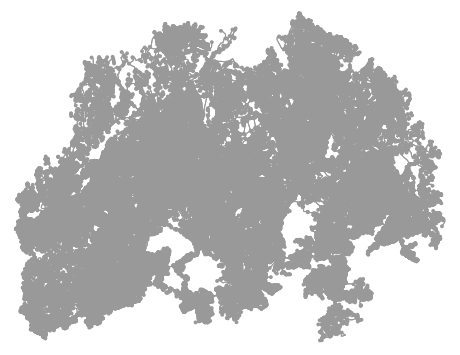

<Figure size 432x288 with 0 Axes>

In [60]:
# Plot the network graph
fig, ax = ox.plot_graph(G,  bgcolor="#ffffff", node_color = '#999999');
plt.tight_layout()
plt.show()

### 3.  Location data of the boat docks avaialble in Helsinki metropolitan area 

As it is an important requirement that the new home will have close access to boat docks. I could fine the infomration about boat docks location from City Service Map of Helsinki: https://palvelukartta.hel.fi/fi/search?q=venesatamat and download the result in JSON format. 

Consider the convenient usage of data, I uploaded it to github  https://raw.githubusercontent.com/maithoa/Coursera_Capstone/master/data_venesatamat.json

In [61]:
#Utility method to read json data from an url
def get_jsonparsed_data(url):
    """
    Receive the content of ``url``, parse it as JSON and return the object.

    Parameters
    ----------
    url : str

    Returns
    -------
    dict
    """
    http = urllib3.PoolManager()
    response = http.request('GET',url, preload_content=False)
    data = json.loads(response.data.decode('utf-8'))
    response.release_conn()
    return data

In [62]:
hel_venesatamat_url = "https://raw.githubusercontent.com/maithoa/Coursera_Capstone/master/data/data_venesatamat.json"

data = get_jsonparsed_data(hel_venesatamat_url)


#Clean the json data and put it to a pandas frame

normalised_data  = json_normalize(data)

#json_data = pd.read_json(hel_venesatamat_url)
#json_data

#Filter needed columns 
filtered_columns = ['name.fi', 'location.coordinates','street_address.fi']
hel_venepaikat =normalised_data.loc[:, filtered_columns]


hel_venepaikat.dropna(axis = 0, inplace = True)
hel_venepaikat.shape

(186, 3)

In [63]:
hel_venepaikat

,name.fi,location.coordinates,street_address.fi
0,Pajalahden venesatama (Meripuistotie) / Venesa...,"[24.88903, 60.158215]",Meripuistotie 1a
1,Eläintarhanlahden venesatama,"[24.941782, 60.18]",Eläintarhantie 10
2,Kipparlahden venesatama,"[25.023306, 60.191067]",Kipparlahdenkuja 3
3,Laivalahden venesatama,"[25.027122, 60.186985]",Simppukarinkatu 2
4,Mesaanikujanlaituri / Venesatama,"[25.070076, 60.16623]",Mesaanikuja 11
...,...,...,...
182,Suomenojan saaristovenelaituri,"[24.719975, 60.14572]",Hylkeenpyytäjäntie 9
183,Taivalsaarenlaituri / Vesiliikennelaituri,"[24.90974, 60.176285]",Hiekkarannantie 3
184,Valkosaaren vierasvenesatama (NJK),"[24.964687, 60.160988]",Valkosaari
185,Valkosaarenlaituri / Vesiliikennelaituri,"[24.963524, 60.161438]",Valkosaari 1


We can see that **there are 186 boat docks around Helsinki Metropolitan Area** however the coordinates format is in (lon,lat) order. And also the data is not in correct format of a normal geometry point. So, additional *cleaning up to be done here: get the lat, lon data to separate columns so that it will be easier to use for visualisation purpose* 
Final data will have 
- name of boat dock in Finnish language
- Street address of boat dock place
- coordinate lat , lon

This will be used to mark the boat docks on map

In [64]:
new  = [pd.to_numeric(x) for x in hel_venepaikat['location.coordinates']]
df = hel_venepaikat['location.coordinates']
location_lat = []
location_lon = []
max_index = len(new)
for i in range (len(new)):
        location_lon.append(new[i].item(0))
        location_lat.append(new[i].item(1))

hel_venepaikat['location.longtitue'] = location_lon
hel_venepaikat['location.latitude'] = location_lat

print ("Data set of boat docks with separate columns for lat lon value")
hel_venepaikat

Data set of boat docks with separate columns for lat lon value


,name.fi,location.coordinates,street_address.fi,location.longtitue,location.latitude
0,Pajalahden venesatama (Meripuistotie) / Venesa...,"[24.88903, 60.158215]",Meripuistotie 1a,24.889030,60.158215
1,Eläintarhanlahden venesatama,"[24.941782, 60.18]",Eläintarhantie 10,24.941782,60.180000
2,Kipparlahden venesatama,"[25.023306, 60.191067]",Kipparlahdenkuja 3,25.023306,60.191067
3,Laivalahden venesatama,"[25.027122, 60.186985]",Simppukarinkatu 2,25.027122,60.186985
4,Mesaanikujanlaituri / Venesatama,"[25.070076, 60.16623]",Mesaanikuja 11,25.070076,60.166230
...,...,...,...,...,...
182,Suomenojan saaristovenelaituri,"[24.719975, 60.14572]",Hylkeenpyytäjäntie 9,24.719975,60.145720
183,Taivalsaarenlaituri / Vesiliikennelaituri,"[24.90974, 60.176285]",Hiekkarannantie 3,24.909740,60.176285
184,Valkosaaren vierasvenesatama (NJK),"[24.964687, 60.160988]",Valkosaari,24.964687,60.160988
185,Valkosaarenlaituri / Vesiliikennelaituri,"[24.963524, 60.161438]",Valkosaari 1,24.963524,60.161438


### 4.  Unit price per square meters for all house type in Helsinki Metropolitan area 

For urban houses unit price per square meter, I get data from Stat.fi service https://pxnet2.stat.fi/PXWeb/pxweb/fi/StatFin/StatFin__asu__ashi__vv/statfin_ashi_pxt_112q.px/ and saved data to an excel file and read the data.
Data will have 
- posno as "postal code" 
- Price_per_m2 to contain price per square meter of the postal code area
- Available_for_sale: to show how many houses are currently on sale


In [65]:
#Read excel house price 
file_path = "data/FI_asuntojen_hinnat.xlsx"
df_asuntojen_hinnat = pd.read_excel(file_path)

#read postinro and add column 
df_asuntojen_hinnat.dropna(inplace = True)


df_asuntojen_hinnat.columns = ['posno','Nimi', '1','Type','2','Year','Price_per_m2','Available_for_sale']
df = df_asuntojen_hinnat[['posno','Price_per_m2','Available_for_sale']]
df.head(20)


,posno,Price_per_m2,Available_for_sale
3,00100,8903,10
4,00120,..,1
5,00130,..,..
6,00140,..,4
7,00150,..,1
8,00160,..,..
9,00170,..,..
10,00180,8654,33
11,00190,..,..
12,00200,7690,20


#### Clean up the data to remove the row where there isn't any available for sale 


In [66]:
#need to average out the price per m2 and sum available_for sales per each postinumero
df = df[(df.Available_for_sale != '..') ]

#Conver value from text to float for prices and to integer for available houses
df["Price_per_m2"] = pd.to_numeric(df["Price_per_m2"], errors='coerce', downcast='float')
df["Available_for_sale"] = pd.to_numeric(df["Available_for_sale"], errors='coerce', downcast='integer')

df.sort_values(by=['posno'])
df

,posno,Price_per_m2,Available_for_sale
3,00100,8903.0,10
4,00120,NaN,1
6,00140,NaN,4
7,00150,NaN,1
10,00180,8654.0,33
...,...,...,...
1625,96460,2108.0,10
1628,96800,NaN,2
1629,96900,2708.0,6
1665,99555,NaN,3


In [67]:
# Group prices by Postal code and get the average selling price

df_hinnat = df.groupby('posno', as_index=False).agg(Avg_price_per_m2=('Price_per_m2','mean'), 
                                            No_of_available= ('Available_for_sale','sum'))
df_hinnat

,posno,Avg_price_per_m2,No_of_available
0,00100,8903.0,10
1,00120,NaN,1
2,00140,NaN,4
3,00150,NaN,1
4,00180,8654.0,33
...,...,...,...
602,96460,2108.0,10
603,96800,NaN,2
604,96900,2708.0,6
605,99555,NaN,3


As you can see from the price dataframe, there are some place that has availabe house however the price is not define. Which is completely fine. We will show what we have. 
However **we filtered out the postal code areas where there aren't any houses on sale.** The data we have from here contains all postal codes from Finland. Later when we join with location data from Helsinki Metropolitan area, we will have a smaller set of data


### 5. Geometry data of postal code areas

We will get geometry data of all postal code areas belong to Helsinki Metropolitan area using webservice wfs_hsy_url = 'https://kartta.hsy.fi/geoserver/wfs'
**Data return by wfs is in gml format. We will use 3rd party tool ogr2ogr to convert gml to geojson**

Additionally, we will combine the geometry data with house price data using postal code to form the final data set for later display them on a Chorolepth map

In [68]:
wfs_hsy_url = 'https://kartta.hsy.fi/geoserver/wfs'
wfs_2_11 = WebFeatureService(url= wfs_hsy_url, version='1.1.0')

In [69]:
#Read geometries of all postinumero belongs to Pääkaupunkiseutu - ESPG:3879
response = wfs_2_11.getfeature(typename='taustakartat_ja_aluejaot:pks_postinumeroalueet_2020')

a = wfs_2_11.get_schema('taustakartat_ja_aluejaot:pks_postinumeroalueet_2020')
#response.read()
a

{'properties': {'posno': 'string',
  'toimip': 'string',
  'toimip_ru': 'string',
  'nimi': 'string',
  'nimi_ru': 'string',
  'kunta': 'string',
  'kunta_nro': 'string'},
 'required': [],
 'geometry': '3D MultiPolygon',
 'geometry_column': 'geom'}

#### As returned data is in KML format, I save it first to KML file and convert it to "postinro_alue.geojson" geojson manually using ogr2ogr tool 

In [70]:
out = open('data_kml_pk_postinro.kml', 'wb')
result = response.read()
if isinstance(result, bytes):
    out.write(result)
else :
    out.write(bytes(result, 'UTF-8'))
    
out.close()
#result

#### Use geopandas to read geojson file to a dataframe

In [71]:
# Read geojson file
df_postinro = gpd.read_file("data/postinro_alue.geojson")
#df.head(1000)
df_postinro.head()

,gml_id,posno,toimip,toimip_ru,nimi,nimi_ru,kunta,kunta_nro,geometry
0,pks_postinumeroalueet_2020.1,00100,HELSINKI,HELSINGFORS,Helsinki Keskusta - Etu-Töölö,Helsingfors centrum - Främre Tölö,Helsinki,091,"MULTIPOLYGON (((25495415.010 6673755.420, 2549..."
1,pks_postinumeroalueet_2020.2,00120,HELSINKI,HELSINGFORS,Punavuori,Rödbergen,Helsinki,091,"MULTIPOLYGON (((25496720.730 6672703.770, 2549..."
2,pks_postinumeroalueet_2020.3,00130,HELSINKI,HELSINGFORS,Kaartinkaupunki,Gardesstaden,Helsinki,091,"MULTIPOLYGON (((25496776.230 6672752.055, 2549..."
3,pks_postinumeroalueet_2020.4,00140,HELSINKI,HELSINGFORS,Kaivopuisto - Ullanlinna,Brunnsparken - Ulrikasborg,Helsinki,091,"MULTIPOLYGON (((25497132.180 6672015.420, 2549..."
4,pks_postinumeroalueet_2020.5,00150,HELSINKI,HELSINGFORS,Eira - Hernesaari,Eira - Ärtholmen,Helsinki,091,"MULTIPOLYGON (((25496970.120 6671136.315, 2549..."


#### Here we can also see that the coordinate is in ESPG:3879 coordinates systems. And in order to show it on Folium map we need to convert the data to ESPG:4326 (WGS84)

In [72]:
#set original CRS
df_postinro.crs = CRS.from_epsg(3879)

# Re-project to WGS84
df_postinro_geo = df_postinro.to_crs(epsg=4326)
df_postinro_geo.head()

,gml_id,posno,toimip,toimip_ru,nimi,nimi_ru,kunta,kunta_nro,geometry
0,pks_postinumeroalueet_2020.1,00100,HELSINKI,HELSINGFORS,Helsinki Keskusta - Etu-Töölö,Helsingfors centrum - Främre Tölö,Helsinki,091,"MULTIPOLYGON (((24.91739 60.17664, 24.91766 60..."
1,pks_postinumeroalueet_2020.2,00120,HELSINKI,HELSINGFORS,Punavuori,Rödbergen,Helsinki,091,"MULTIPOLYGON (((24.94093 60.16721, 24.94107 60..."
2,pks_postinumeroalueet_2020.3,00130,HELSINKI,HELSINGFORS,Kaartinkaupunki,Gardesstaden,Helsinki,091,"MULTIPOLYGON (((24.94193 60.16764, 24.95107 60..."
3,pks_postinumeroalueet_2020.4,00140,HELSINKI,HELSINGFORS,Kaivopuisto - Ullanlinna,Brunnsparken - Ulrikasborg,Helsinki,091,"MULTIPOLYGON (((24.94835 60.16103, 24.94846 60..."
4,pks_postinumeroalueet_2020.5,00150,HELSINKI,HELSINGFORS,Eira - Hernesaari,Eira - Ärtholmen,Helsinki,091,"MULTIPOLYGON (((24.94545 60.15314, 24.94237 60..."


#### Finally, we will combine geometry data with the average house price and available houses to one dataframe for later to show on Chorolepth map

In [73]:
#merge the geo to get price and available number
df_postinro_geo = df_postinro_geo.merge(df_hinnat, left_on='posno', right_on='posno')
df_postinro_geo
 

,gml_id,posno,toimip,toimip_ru,nimi,nimi_ru,kunta,kunta_nro,geometry,Avg_price_per_m2,No_of_available
0,pks_postinumeroalueet_2020.1,00100,HELSINKI,HELSINGFORS,Helsinki Keskusta - Etu-Töölö,Helsingfors centrum - Främre Tölö,Helsinki,091,"MULTIPOLYGON (((24.91739 60.17664, 24.91766 60...",8903.0,10
1,pks_postinumeroalueet_2020.2,00120,HELSINKI,HELSINGFORS,Punavuori,Rödbergen,Helsinki,091,"MULTIPOLYGON (((24.94093 60.16721, 24.94107 60...",NaN,1
2,pks_postinumeroalueet_2020.4,00140,HELSINKI,HELSINGFORS,Kaivopuisto - Ullanlinna,Brunnsparken - Ulrikasborg,Helsinki,091,"MULTIPOLYGON (((24.94835 60.16103, 24.94846 60...",NaN,4
3,pks_postinumeroalueet_2020.5,00150,HELSINKI,HELSINGFORS,Eira - Hernesaari,Eira - Ärtholmen,Helsinki,091,"MULTIPOLYGON (((24.94545 60.15314, 24.94237 60...",NaN,1
4,pks_postinumeroalueet_2020.8,00180,HELSINKI,HELSINGFORS,Kamppi - Ruoholahti,Kampen - Gräsviken,Helsinki,091,"MULTIPOLYGON (((24.92810 60.16730, 24.92805 60...",8654.0,33
...,...,...,...,...,...,...,...,...,...,...,...
115,pks_postinumeroalueet_2020.163,02780,ESPOO,ESBO,Kauklahti,Köklax,Espoo,049,"MULTIPOLYGON (((24.65594 60.18424, 24.65113 60...",3983.0,40
116,pks_postinumeroalueet_2020.164,02810,ESPOO,ESBO,Gumböle-Karhusuo,Gumböle-Björnkärr,Espoo,049,"MULTIPOLYGON (((24.64847 60.21833, 24.64822 60...",3682.0,8
117,pks_postinumeroalueet_2020.165,02820,ESPOO,ESBO,Nupuri-Nuuksio,Nupurböle-Noux,Espoo,049,"MULTIPOLYGON (((24.63111 60.29529, 24.63087 60...",NaN,5
118,pks_postinumeroalueet_2020.167,02920,ESPOO,ESBO,Niipperi,Nipert,Espoo,049,"MULTIPOLYGON (((24.76743 60.26564, 24.75539 60...",3719.0,15


We also see that the dataset now is smaller. It contains only data of the postal code that belong to Helsinki Metropolitan area

In [74]:
# Remove the unnecessary columns 
df_postinro_geo = df_postinro_geo[['posno','nimi','geometry','Avg_price_per_m2','No_of_available']]
df_postinro_geo 

,posno,nimi,geometry,Avg_price_per_m2,No_of_available
0,00100,Helsinki Keskusta - Etu-Töölö,"MULTIPOLYGON (((24.91739 60.17664, 24.91766 60...",8903.0,10
1,00120,Punavuori,"MULTIPOLYGON (((24.94093 60.16721, 24.94107 60...",NaN,1
2,00140,Kaivopuisto - Ullanlinna,"MULTIPOLYGON (((24.94835 60.16103, 24.94846 60...",NaN,4
3,00150,Eira - Hernesaari,"MULTIPOLYGON (((24.94545 60.15314, 24.94237 60...",NaN,1
4,00180,Kamppi - Ruoholahti,"MULTIPOLYGON (((24.92810 60.16730, 24.92805 60...",8654.0,33
...,...,...,...,...,...
115,02780,Kauklahti,"MULTIPOLYGON (((24.65594 60.18424, 24.65113 60...",3983.0,40
116,02810,Gumböle-Karhusuo,"MULTIPOLYGON (((24.64847 60.21833, 24.64822 60...",3682.0,8
117,02820,Nupuri-Nuuksio,"MULTIPOLYGON (((24.63111 60.29529, 24.63087 60...",NaN,5
118,02920,Niipperi,"MULTIPOLYGON (((24.76743 60.26564, 24.75539 60...",3719.0,15


### 5. Foursquare data

#### To be defined later when the postal code areas are pin pointed. 
We need to do the analysis to find out the promising postal code, then later we will access Foursquare and find venues information and do further exploration about the neigbourhoods of interests

## Methodology

We will use network analysis to circle out the areas where it will take less than 25 minutes to cycling to the work place, which is Pasila (60.197873, 24.9322653) that we found in previous step

The steps to find travel distance and show it on a map as **Travel Time Map**
- Identify the center point 
- Identify the time that is used for calculation: Here we define 16 minutes as ideal one and 25 minutes as the maximum travel time we can accept 
- Find the nodes in the network that can form the areas that fit the time travel - using networkkx library to calculate the travel distance
- Create polygons that represents the border of areas that will take within 16 minutes to travel to work and <25 minutes to travel to work
- Show the result on the map to represent as Travel Time Map.

### 1. Define the travel zone that will take less than 16 minutes and 25 minutes by bicycling and visualise it on map


#### Identify the center point

In [75]:
# find the centermost node and then project the graph to UTM
#center_node
center_node = ox.get_nearest_node(G, [pasila_latitude, pasila_longitude])
#Project graph to UTM for calculating the travel distance more accurately
G = ox.project_graph(G)

#### Define trip times and travel speed then calculate the travel time for each node

In [76]:
#Define travel time
# Trip time in Mintues : 16 minutes is the ideal time of travel to work, 25 is the average
trip_times = [16, 25]

# walking speed in km/hour :30km/hour for driving and 5km/hour for cycling 19-26km/hour
travel_speed = 22 

# add an edge attribute for time in minutes required to traverse each edge
meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute
for u, v, k, data in G.edges(data=True, keys=True):
    data['time'] = data['length'] / meters_per_minute

#### Utilities method to make the polygon out of existing nodes

In [77]:
def make_iso_polys(G, edge_buff=25, node_buff=50, infill=False):
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance='time')

        node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
        nodes_gdf = gpd.GeoDataFrame({'id': list(subgraph.nodes)}, geometry=node_points)
        nodes_gdf = nodes_gdf.set_index('id')

        edge_lines = []
        for n_fr, n_to in subgraph.edges():
            f = nodes_gdf.loc[n_fr].geometry
            t = nodes_gdf.loc[n_to].geometry
            edge_lookup = G.get_edge_data(n_fr, n_to)[0].get('geometry',  LineString([f,t]))
            edge_lines.append(edge_lookup)

        n = nodes_gdf.buffer(node_buff).geometry
        e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
        all_gs = list(n) + list(e)
        new_iso = gpd.GeoSeries(all_gs).unary_union
        
        # try to fill in surrounded areas so shapes will appear solid and blocks without white space inside them
        if infill:
            new_iso = Polygon(new_iso.exterior)
        isochrone_polys.append(new_iso)
    return isochrone_polys




#### Make the isochrone polygons

In [78]:
#Create the polygons that is connect the nodes rather than a convex hull 
isochrone_polys = make_iso_polys(G, edge_buff=25, node_buff=0, infill=True)



#### Convert the polygons coordinate to WGS84 for displaying on Folium map

In [79]:
isochrone_polys_geojson_4326 = gpd.GeoSeries(isochrone_polys, crs = 32635).to_crs(4326).to_json()
#isochrone_polys_geojson_4326

#### Show the travel times isochrone polygons on Folium map

In [204]:
m = folium.Map(
    location=[pasila_latitude, pasila_longitude],
    tiles='Cartodb Positron',
    zoom_start=12
)

folium.GeoJson(isochrone_polys_geojson_4326,
   style_function = lambda x:{
       'color' : 'green',
       'opacity': 2,
       'fillColor' : 'white'
   }
).add_to(m)

folium.Marker([pasila_latitude, pasila_longitude], popup="Pasila").add_to(m)

folium.LayerControl().add_to(m)
m

#### As seen above, we can define now 2 rings that shown the areas where travel time would take less than 16 minutes and less than 25 minutes by bicycling

### 2. Mark the boat docks areas on map so that it is easier to pin point which area to look for new apartment

In [81]:
callback = """\
function (row) {
    var icon, marker;
    icon = L.AwesomeMarkers.icon({
        icon: "anchor",prefix: 'fa', markerColor: "red"});
    marker = L.marker(new L.LatLng(row[0], row[1]));
    marker.setIcon(icon);
    return marker;
};
"""

In [196]:
m = folium.Map(
    location=[pasila_latitude, pasila_longitude],
    tiles='Cartodb Positron',
    zoom_start=12
)

FastMarkerCluster(data=list(zip(location_lat, location_lon)), callback=callback).add_to(m)
folium.GeoJson(isochrone_polys_geojson_4326,
   style_function = lambda x:{
       'color' : 'green',
       'opacity': 2,
       'fillColor':'white'
   }
).add_to(m)

folium.Marker([pasila_latitude, pasila_longitude], popup="Pasila").add_to(m)



folium.LayerControl().add_to(m);

m

#### We can see that there are about 15 places that we can look closer, which fit the conditions of optimum travel distance to work palce and have boat docks 🎉

### 3. Show the price of houses per postal code to see where has the best price

In [197]:
m = folium.Map(
    location=[pasila_latitude, pasila_longitude],
    tiles='Cartodb Positron',
    zoom_start=12
)

FastMarkerCluster(data=list(zip(location_lat, location_lon)), callback=callback, name = 'Boat places').add_to(m)

travel_times = folium.GeoJson(isochrone_polys_geojson_4326, name = "Travel times",
   style_function = lambda x:{
       'color' : 'green',
       'opacity': 2,
       'fillColor':'white'
   }
)

travel_times.add_to(m)

choropleth = folium.Choropleth(
    geo_data=df_postinro_geo,
    name="choropleth",
    data=df_hinnat,
    columns=["posno", "Avg_price_per_m2"],
    key_on = "feature.properties.posno",
    fill_color="RdYlBu",
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name="Average price per m2",
    nan_fill_color = 'white'
).add_to(m)



work_place = folium.Marker([pasila_latitude, pasila_longitude], popup="Pasila", name = "Work place")
work_place.add_to(m)

folium.LayerControl().add_to(m)

# add labels indicating the postinumero and price of the community
style_function = "font-size: 15px; font-weight: 0.8"
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields=['posno','nimi', 'No_of_available', 'Avg_price_per_m2'], 
                                   aliases = ['Postinro','Nimi','On sale','Avg Price per m2'],
                                   sticky=False, style=style_function, labels=True))

m

## 4. Conclusions on the Postal code areas that are potential 
- Roihuvuori - has 4 boat docks and the average price is 4774 per sqm with 6 available houses - 25mins to work 
- Herttoniemi - has 7 boat docks  and average price is 5802 per sqm with 28 available houses - 25 mins to work 
- Kallio - has 7 boat docks and average price is 8840 per sqm and 12 available houses - 16 mins to work 
- Kamppi - Ruoholahti - has 8 boat docks and avg price is 8654 with 33 houses - 16 mins to work
- Lauttasaari - 8 boat docks and avg price is 7690 with 20 houses - 25 mins to work 
- Tapiola - 2 boat docks and avg price is 7258 with 72 houses- 25 mins to work 
- Etelä-Leppävaara - 1 boat dock and avg price is 4441 with 34 houses - 25 mins to work 



#### We will put the potential areas to a dataframe so that it's easier to see


In [94]:
data = [['00820', 'Roihuvuori',4,4474,6,25]
        ,['00810', 'Herttoniemi',7,5802,28,25]
        ,['00530', 'Kallio',7,8840,12,16]
        ,['00180', 'Kamppi',8,8654,33,16]
        ,['00200', 'Lauttasaari',8,7690,20,25]
        ,['02100', 'Tapiola',2,7258,2,25]
        ,['02600', 'Etelä-Leppävaara',1,4441,34,25]]
df = pd.DataFrame(columns = ['Postal code', 'Name', 'Boat docks','Unit price', 'Available houses', 'Travel time'], data = data)
df.sort_values(by=['Travel time', 'Unit price'], inplace=True,  ascending=False)
df


,Postal code,Name,Boat docks,Unit price,Available houses,Travel time
4,00200,Lauttasaari,8,7690,20,25
5,02100,Tapiola,2,7258,2,25
1,00810,Herttoniemi,7,5802,28,25
0,00820,Roihuvuori,4,4474,6,25
6,02600,Etelä-Leppävaara,1,4441,34,25
2,00530,Kallio,7,8840,12,16
3,00180,Kamppi,8,8654,33,16


#### Loop and get the coordinates for each postal code area

In [95]:

# Generate result using pandas
posnos = df['Postal code']
names = df['Name']
lats = []
lons = []
for pos, name in zip(posnos, names):
    address = str(pos) +", "+name+ ", Finland"
    print (address)
    location = geolocator.geocode(address)

    lats.append(location.latitude)
    lons.append(location.longitude)

       
df["Lat"] = lats
df["Lon"] = lons

df

00200, Lauttasaari, Finland
02100, Tapiola, Finland
00810, Herttoniemi, Finland
00820, Roihuvuori, Finland
02600, Etelä-Leppävaara, Finland
00530, Kallio, Finland
00180, Kamppi, Finland


,Postal code,Name,Boat docks,Unit price,Available houses,Travel time,Lat,Lon
4,00200,Lauttasaari,8,7690,20,25,60.160602,24.873341
5,02100,Tapiola,2,7258,2,25,60.177749,24.803194
1,00810,Herttoniemi,7,5802,28,25,60.195525,25.029063
0,00820,Roihuvuori,4,4474,6,25,60.201467,25.061147
6,02600,Etelä-Leppävaara,1,4441,34,25,60.216144,24.813735
2,00530,Kallio,7,8840,12,16,60.181662,24.952249
3,00180,Kamppi,8,8654,33,16,60.163730,24.923990


## 5. Focus on the selected areas and analyse the area what kind of neighbourhood it has

### Access Foursquare API and get data

#### Foursquare keys


In [15]:
CLIENT_ID = 'B3JXR2BRDOV3HTRROWE405OQCF5ZV54QVPWXPXNZREPFJAOR' # your Foursquare ID
CLIENT_SECRET = 'LH0K4GEDVHCDMOLYXK20EKO3UV0L0DKX45SOTW5AQDJWWQJC' # your Foursquare Secret
ACCESS_TOKEN = 'J2MDKH2UZA2M1KJUI5QXVOZZLJJ12X4R20EDRB0XZWBZQKDD' # your FourSquare Access Token
#{"access_token":"J2MDKH2UZA2M1KJUI5QXVOZZLJJ12X4R20EDRB0XZWBZQKDD"}
VERSION = '20180605'
LIMIT = 30

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)



Your credentails:
CLIENT_ID: B3JXR2BRDOV3HTRROWE405OQCF5ZV54QVPWXPXNZREPFJAOR
CLIENT_SECRET:LH0K4GEDVHCDMOLYXK20EKO3UV0L0DKX45SOTW5AQDJWWQJC


#### Utilities method to get venues of a list of places

In [125]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Postal Code', 
                  'Postalcode Latitude', 
                  'Postalcode Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Now we can get venues of the promising postal code areas to get more insights on these areas

In [123]:

promising_areas_venues = getNearbyVenues(names = df['Postal code'],
                                   latitudes=df['Lat'],
                                   longitudes=df['Lon']
                                  )

00200
02100
00810
00820
02600
00530
00180


In [127]:
promising_areas_venues
promising_areas_venues = promising_areas_venues[promising_areas_venues['Venue Category']!='Bus Stop']
promising_areas_venues

,Postal Code,Postalcode Latitude,Postalcode Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,00200,60.160602,24.873341,Leikkipuisto Lahnalahti,60.159907,24.876336,Playground
1,00200,60.160602,24.873341,Pikku-Katti,60.160490,24.879938,Dive Bar
2,00200,60.160602,24.873341,Korat Thai,60.160188,24.877365,Thai Restaurant
3,00200,60.160602,24.873341,Casa Mare,60.160116,24.877261,Restaurant
4,00200,60.160602,24.873341,Pizzeria Luca,60.160130,24.880696,Pizza Place
...,...,...,...,...,...,...,...
280,00180,60.163730,24.923990,Living Room Bar & Terrace,60.159716,24.921968,Lounge
281,00180,60.163730,24.923990,Hampton Bay,60.160724,24.929216,Restaurant
282,00180,60.163730,24.923990,Finanssiala ry,60.163920,24.916080,Business Service
283,00180,60.163730,24.923990,Sinebrychoffin puiston koira-aitaus,60.162274,24.931864,Dog Run


#### So there are 271 venues that we can get from Foursquares for the selected postal code areas. Let's group them by Postal code and see if we can describe characteristic of each postal code areas

##### Let's check how many venues were returned for each neighborhood

In [128]:
promising_areas_venues.groupby('Postal Code').count()

,Postalcode Latitude,Postalcode Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Postal Code,,,,,,
00180,73,73,73,73,73,73
00200,20,20,20,20,20,20
00530,61,61,61,61,61,61
00810,24,24,24,24,24,24
00820,10,10,10,10,10,10
02100,42,42,42,42,42,42
02600,41,41,41,41,41,41


#### Let's see how many unique venues categories 

In [143]:
print('There are {} uniques categories.'.format(len(promising_areas_venues['Venue Category'].unique())))

There are 116 uniques categories.


### Analyse 

#### First we convert the venues dataset so that it laids out the venue by categories for for each venue and keep the postal code

In [176]:
# one hot encoding
postalcode_onehot = pd.get_dummies(promising_areas_venues[['Venue Category']], prefix="", prefix_sep="")

postalcode_onehot


,Art Gallery,Art Museum,Bakery,Bar,Beer Bar,Bike Rental / Bike Share,Bistro,Bookstore,Bowling Alley,Breakfast Spot,...,Toy / Game Store,Train Station,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
281,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
282,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
283,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [177]:
# add postalcode column back to dataframe
postalcode_onehot['Postal Code'] = promising_areas_venues['Postal Code'] 

# move postalcode column to the first column
fixed_columns = [postalcode_onehot.columns[-1]] + list(postalcode_onehot.columns[:-1])
postalcode_onehot = postalcode_onehot[fixed_columns]

postalcode_onehot

,Postal Code,Art Gallery,Art Museum,Bakery,Bar,Beer Bar,Bike Rental / Bike Share,Bistro,Bookstore,Bowling Alley,...,Toy / Game Store,Train Station,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Yoga Studio
0,00200,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,00200,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,00200,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,00200,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,00200,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280,00180,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
281,00180,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
282,00180,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
283,00180,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Now let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [184]:
postalcode_grouped = postalcode_onehot.groupby('Postal Code').mean().reset_index()
postalcode_grouped

,Postal Code,Art Gallery,Art Museum,Bakery,Bar,Beer Bar,Bike Rental / Bike Share,Bistro,Bookstore,Bowling Alley,...,Toy / Game Store,Train Station,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Yoga Studio
0,00180,0.013699,0.013699,0.000000,0.013699,0.013699,0.013699,0.000000,0.00000,0.00000,...,0.013699,0.00000,0.00000,0.00000,0.00000,0.013699,0.027397,0.013699,0.013699,0.000000
1,00200,0.000000,0.000000,0.000000,0.050000,0.000000,0.000000,0.000000,0.05000,0.00000,...,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
2,00530,0.000000,0.000000,0.032787,0.065574,0.016393,0.000000,0.016393,0.00000,0.00000,...,0.000000,0.00000,0.00000,0.00000,0.04918,0.016393,0.016393,0.016393,0.000000,0.016393
3,00810,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,...,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
4,00820,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,...,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
5,02100,0.000000,0.023810,0.023810,0.000000,0.000000,0.000000,0.000000,0.00000,0.02381,...,0.000000,0.00000,0.02381,0.02381,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
6,02600,0.000000,0.000000,0.000000,0.000000,0.024390,0.000000,0.000000,0.02439,0.02439,...,0.024390,0.02439,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000


#### Let's check the top 5 venues for each postal code area

In [131]:
num_top_venues = 5

for hood in postalcode_grouped['Postal Code']:
    print("----"+hood+"----")
    temp = postalcode_grouped[postalcode_grouped['Postal Code'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----00180----
                     venue  freq
0               Restaurant  0.07
1  Scandinavian Restaurant  0.05
2           Sandwich Place  0.05
3            Grocery Store  0.04
4       Italian Restaurant  0.04


----00200----
             venue  freq
0      Pizza Place  0.10
1      Coffee Shop  0.05
2  Thai Restaurant  0.05
3       Restaurant  0.05
4      Flower Shop  0.05


----00530----
                           venue  freq
0                           Café  0.08
1                            Bar  0.07
2                           Park  0.07
3                Thai Restaurant  0.05
4  Vegetarian / Vegan Restaurant  0.05


----00810----
                  venue  freq
0           Supermarket  0.12
1  Gym / Fitness Center  0.12
2        Clothing Store  0.08
3     Convenience Store  0.08
4           Post Office  0.04


----00820----
             venue  freq
0             Park   0.3
1             Café   0.2
2    Grocery Store   0.1
3  Harbor / Marina   0.1
4      Pizza Place   0.1


----0210

#### Put the results above to a pandas frame

In [132]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [157]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Postal Code']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)

neighborhoods_venues_sorted['Postal Code'] = postalcode_grouped['Postal Code']

for ind in np.arange(postalcode_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(postalcode_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted


,Postal Code,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,00180,Restaurant,Scandinavian Restaurant,Sandwich Place,Grocery Store,Italian Restaurant,Seafood Restaurant,Playground,Himalayan Restaurant,Waterfront,Hotel
1,00200,Pizza Place,Coffee Shop,Thai Restaurant,Restaurant,Flower Shop,Gym / Fitness Center,Scenic Lookout,Harbor / Marina,Shopping Mall,Skate Park
2,00530,Café,Bar,Park,Thai Restaurant,Vegetarian / Vegan Restaurant,Grocery Store,Hotel,Breakfast Spot,Dive Bar,Playground
3,00810,Supermarket,Gym / Fitness Center,Clothing Store,Convenience Store,Post Office,Sushi Restaurant,Hotel,Chinese Restaurant,Taxi Stand,Himalayan Restaurant
4,00820,Park,Café,Grocery Store,Harbor / Marina,Pizza Place,Shopping Mall,Convenience Store,Pub,Post Office,Art Gallery
5,02100,Coffee Shop,Optical Shop,Pizza Place,Department Store,Juice Bar,Supermarket,Steakhouse,Sporting Goods Shop,Post Office,Falafel Restaurant
6,02600,Coffee Shop,Gym / Fitness Center,Ice Cream Shop,Indian Restaurant,Supermarket,Cafeteria,Kids Store,Donut Shop,Electronics Store,Sporting Goods Shop


### Determine the optimal K value for k-means using Elbow method

#### We would like to cluster also base on travel time and unit price of house per sqm. So we will merge the dataset before doing clustering

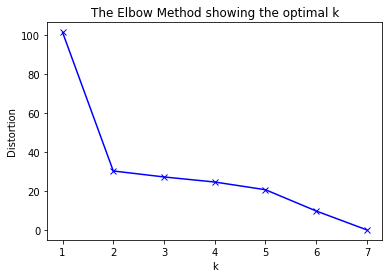

In [185]:
from scipy.spatial.distance import cdist

distortions = []
K = range(1,8)
postalcode_grouped_clustering = postalcode_grouped.drop('Postal Code', 1)

for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(postalcode_grouped_clustering)

    distortions.append(sum(np.min(cdist(postalcode_grouped_clustering, kmeanModel.cluster_centers_, 'canberra'), axis=1)) / postalcode_grouped_clustering.shape[0])

#There are different metric distance function for spatial distance. 
#I choose correlation instaed of euclidean because the canberra function gives me more clear view of elbow break point.

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

#### Looks like the optimal k can be either 2 or 3 - we can try Silhouette Score to check again 

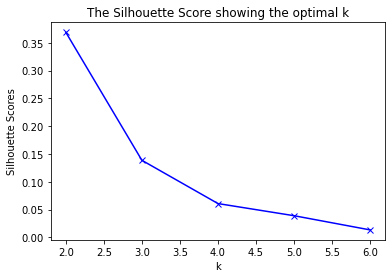

In [186]:
from sklearn.metrics import silhouette_score

sil = []
kmax = 6
K = range(2,kmax+1)

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in K:
  kmeans = KMeans(n_clusters = k).fit(postalcode_grouped_clustering)
  labels = kmeans.labels_
  sil.append(silhouette_score(postalcode_grouped_clustering, labels, metric = 'euclidean'))

# Plot the elbow
plt.plot(K, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette Scores')
plt.title('The Silhouette Score showing the optimal k')
plt.show()

### Combine both evaluations, we will choose k = 2 for clustering

In [175]:
# set number of clusters
kclusters = 2


# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(postalcode_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 1, 1, 1, 0, 1, 1], dtype=int32)

#### Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [158]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
postalcode_merged = df

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
postalcode_merged = postalcode_merged.join(neighborhoods_venues_sorted.set_index('Postal Code'), on='Postal code')

postalcode_merged.head(100) # check the last columns!



,Postal code,Name,Boat docks,Unit price,Available houses,Travel time,Lat,Lon,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,00200,Lauttasaari,8,7690,20,25,60.160602,24.873341,1,Pizza Place,Coffee Shop,Thai Restaurant,Restaurant,Flower Shop,Gym / Fitness Center,Scenic Lookout,Harbor / Marina,Shopping Mall,Skate Park
5,02100,Tapiola,2,7258,2,25,60.177749,24.803194,1,Coffee Shop,Optical Shop,Pizza Place,Department Store,Juice Bar,Supermarket,Steakhouse,Sporting Goods Shop,Post Office,Falafel Restaurant
1,00810,Herttoniemi,7,5802,28,25,60.195525,25.029063,1,Supermarket,Gym / Fitness Center,Clothing Store,Convenience Store,Post Office,Sushi Restaurant,Hotel,Chinese Restaurant,Taxi Stand,Himalayan Restaurant
0,00820,Roihuvuori,4,4474,6,25,60.201467,25.061147,0,Park,Café,Grocery Store,Harbor / Marina,Pizza Place,Shopping Mall,Convenience Store,Pub,Post Office,Art Gallery
6,02600,Etelä-Leppävaara,1,4441,34,25,60.216144,24.813735,1,Coffee Shop,Gym / Fitness Center,Ice Cream Shop,Indian Restaurant,Supermarket,Cafeteria,Kids Store,Donut Shop,Electronics Store,Sporting Goods Shop
2,00530,Kallio,7,8840,12,16,60.181662,24.952249,1,Café,Bar,Park,Thai Restaurant,Vegetarian / Vegan Restaurant,Grocery Store,Hotel,Breakfast Spot,Dive Bar,Playground
3,00180,Kamppi,8,8654,33,16,60.163730,24.923990,1,Restaurant,Scandinavian Restaurant,Sandwich Place,Grocery Store,Italian Restaurant,Seafood Restaurant,Playground,Himalayan Restaurant,Waterfront,Hotel


### Examine Cluster 0

In [159]:
postalcode_merged.loc[postalcode_merged['Cluster Labels'] == 0, postalcode_merged.columns[[1] + list(range(5, postalcode_merged.shape[1]))]]

,Name,Travel time,Lat,Lon,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Roihuvuori,25,60.201467,25.061147,0,Park,Café,Grocery Store,Harbor / Marina,Pizza Place,Shopping Mall,Convenience Store,Pub,Post Office,Art Gallery


### Examine Cluster 1

In [160]:
postalcode_merged.loc[postalcode_merged['Cluster Labels'] == 1, postalcode_merged.columns[[1] + list(range(5, postalcode_merged.shape[1]))]]

,Name,Travel time,Lat,Lon,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Lauttasaari,25,60.160602,24.873341,1,Pizza Place,Coffee Shop,Thai Restaurant,Restaurant,Flower Shop,Gym / Fitness Center,Scenic Lookout,Harbor / Marina,Shopping Mall,Skate Park
5,Tapiola,25,60.177749,24.803194,1,Coffee Shop,Optical Shop,Pizza Place,Department Store,Juice Bar,Supermarket,Steakhouse,Sporting Goods Shop,Post Office,Falafel Restaurant
1,Herttoniemi,25,60.195525,25.029063,1,Supermarket,Gym / Fitness Center,Clothing Store,Convenience Store,Post Office,Sushi Restaurant,Hotel,Chinese Restaurant,Taxi Stand,Himalayan Restaurant
6,Etelä-Leppävaara,25,60.216144,24.813735,1,Coffee Shop,Gym / Fitness Center,Ice Cream Shop,Indian Restaurant,Supermarket,Cafeteria,Kids Store,Donut Shop,Electronics Store,Sporting Goods Shop
2,Kallio,16,60.181662,24.952249,1,Café,Bar,Park,Thai Restaurant,Vegetarian / Vegan Restaurant,Grocery Store,Hotel,Breakfast Spot,Dive Bar,Playground
3,Kamppi,16,60.163730,24.923990,1,Restaurant,Scandinavian Restaurant,Sandwich Place,Grocery Store,Italian Restaurant,Seafood Restaurant,Playground,Himalayan Restaurant,Waterfront,Hotel


#### Looks like Roihuvuori doesn't contain many restaurants and has Parks, Cafe and Grocery Stores. While all other places are having a rich collection of varieties of restaurants to serve the residents in the area. 



### Now let's sort again our result data set and order them by the order of Unit Price, Travel time and cluster labels

In [191]:
postalcode_merged.sort_values(by=['Unit price', 'Travel time'], inplace = True)
postalcode_merged.sort_values(by=['Cluster Labels'],ascending = False, inplace = True)
postalcode_merged

,Postal code,Name,Boat docks,Unit price,Available houses,Travel time,Lat,Lon,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,02600,Etelä-Leppävaara,1,4441,34,25,60.216144,24.813735,1,Coffee Shop,Gym / Fitness Center,Ice Cream Shop,Indian Restaurant,Supermarket,Cafeteria,Kids Store,Donut Shop,Electronics Store,Sporting Goods Shop
1,00810,Herttoniemi,7,5802,28,25,60.195525,25.029063,1,Supermarket,Gym / Fitness Center,Clothing Store,Convenience Store,Post Office,Sushi Restaurant,Hotel,Chinese Restaurant,Taxi Stand,Himalayan Restaurant
5,02100,Tapiola,2,7258,2,25,60.177749,24.803194,1,Coffee Shop,Optical Shop,Pizza Place,Department Store,Juice Bar,Supermarket,Steakhouse,Sporting Goods Shop,Post Office,Falafel Restaurant
4,00200,Lauttasaari,8,7690,20,25,60.160602,24.873341,1,Pizza Place,Coffee Shop,Thai Restaurant,Restaurant,Flower Shop,Gym / Fitness Center,Scenic Lookout,Harbor / Marina,Shopping Mall,Skate Park
3,00180,Kamppi,8,8654,33,16,60.163730,24.923990,1,Restaurant,Scandinavian Restaurant,Sandwich Place,Grocery Store,Italian Restaurant,Seafood Restaurant,Playground,Himalayan Restaurant,Waterfront,Hotel
2,00530,Kallio,7,8840,12,16,60.181662,24.952249,1,Café,Bar,Park,Thai Restaurant,Vegetarian / Vegan Restaurant,Grocery Store,Hotel,Breakfast Spot,Dive Bar,Playground
0,00820,Roihuvuori,4,4474,6,25,60.201467,25.061147,0,Park,Café,Grocery Store,Harbor / Marina,Pizza Place,Shopping Mall,Convenience Store,Pub,Post Office,Art Gallery


### Finally let's visualise the clustering result of candidate postal code areas on map

In [198]:
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, pos, poi, cluster in zip(postalcode_merged['Lat'], postalcode_merged['Lon'], postalcode_merged['Postal code'] ,postalcode_merged['Name'], postalcode_merged['Cluster Labels']):
    label = folium.Popup(str(pos) +' '+str(poi)+ ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(m)
    
m

## Results and Discussion <a name="results"></a>

In our analysis, we are having two strong factors that already limit our focus areas in the search
- Travel time to work place by bicycling : less than 16 min as ideal and less than 25 mins as acceptable duration range
- Availablility of boat docking places. : this is a must

Among the candidate areas that we are able to pick up after narrows the areas down using travel time and boat docking places, by clustering our analysis shows that
- Most of the candidate areas in Cluster 1 are offering the residents same set of places that is supporting a convenient life : Restaurants, Coffee shops, Pizza place, Supermarket or Department stores, Park, Gym or Playground. 
- Only one area, Roihuvuori, in Cluster 0 has quite limited and simple offer of Restaurants 


Result of all this is 7 postalcode areas that match the main 2 factors with information about average houseprices and some additional information about what each area has to offer the residents.
Recommended postal codes for my friend to look for new home  should therefore be considered only as a starting point for more detailed analysis which could eventually result in location which my friend wants to settle. 

## Conclusions

Purpose of this project is to identify the potential areas for a person to start looking for new home. The areas should provide optimal distance to travel to work place and has close access to boat docking places. In addition to that we provide information regarding house prices, neigbourhood analysis for the candidates so that it will help with making the decision. 

Final decission on optimal new home location will be made by the person based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like attractiveness of each location (proximity to park or water)real estate availability, type, conditions, prices, social and economic dynamics of every neighborhood etc.

## References 

-  Public Map service of Helsinki for getting boat docks location:  https://palvelukartta.hel.fi/fi/search?q=venesatamat
-  Public statistic service of Finland to get the housing prices data per postal code area https://pxnet2.stat.fi/PXWeb/pxweb/fi/StatFin/StatFin__asu__ashi__vv/statfin_ashi_pxt_112q.px/ 
-  Web Features service of Helsinki Metropolitan areas to get the geometry of https://kartta.hsy.fi/geoserver/wfs
-  https://github.com/gboeing/osmnx-examples